<a href="https://colab.research.google.com/github/Dishaa01423/Plant-Disease-Detection/blob/main/Tomato_Plant_Disease_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Tomato Disease Detection**

## **Introduction**:

> #### *Problem Statement*:
> > Few farmers are facing with issue with in the farm. There are lots of problems in the agricultural sector in the perspective of the farmer, but we can help them by integrating the AI Technology. Even after selecting and growing the crop in the field, few
crop diseases are not identified by the farmer which results to decrease in the crop yield. This is the main problem in the field so we are going to solve this issue by developing a model which can recognize the disease that is caused by the input of an image of the diseased plant. By
tackling this, we can increase the crop yield and maintain the crop production.

> #### *Overview of the project*:
> > This project involves building and loading the data, **Plant Village Dataset**, Exploratory Data Analysis, Model Building and Training.  
> #### *Goal of this project*:
> > The goal of this project is to build model for tomato crop and to observe the performance metrics of the model
> #### *Result*:
> > With this we can hence use the model for any web application for tomato crop managment systems or Tomato plant Disease detection system.

In [ ]:
%%bash
#install kaggle
pip install -q kaggle

#create a Kaggle folder andcopy kaggle.json to copied folder
echo '{"username":"disha1503","key":"3d1810121b6c88f023679868aa91845b"}' > ~/.kaggle/kaggle.json

#permission for json to act
chmod 600 ~/.kaggle/kaggle.json

#downloading the dataset
kaggle datasets download -d shylesh101/tomato-leaf-disease

# unziping the dataset
unzip tomato-leaf-disease.zip

# installing the tensorflow library
pip install tensorflow


Dataset URL: https://www.kaggle.com/datasets/shylesh101/tomato-leaf-disease
License(s): unknown

Archive:  tomato-leaf-disease.zip
  inflating: tomato_dataset/test/Tomato___Bacterial_spot/0c32d6d5-bf5b-4904-8108-d7a901f2cb6b___UF.GRC_BS_Lab Leaf 8662.JPG  
  inflating: tomato_dataset/test/Tomato___Bacterial_spot/0c9b7dd9-a0c7-4b6e-bb4d-b2e3cab833d0___GCREC_Bact.Sp 6081.JPG  
  inflating: tomato_dataset/test/Tomato___Bacterial_spot/0cbaca0d-e422-438f-89df-344b493888b8___GCREC_Bact.Sp 5832.JPG  
  inflating: tomato_dataset/test/Tomato___Bacterial_spot/0db0e663-b580-45b3-bd20-bc8a7f3d8b34___GCREC_Bact.Sp 6189.JPG  
  inflating: tomato_dataset/test/Tomato___Bacterial_spot/0e591ff9-a58f-4748-ac0f-984233f441af___GCREC_Bact.Sp 3292.JPG  
  inflating: tomato_dataset/test/Tomato___Early_blight/1e02dbef-ecc2-4c1b-ae5a-b90057505574___RS_Erly.B 9475.JPG  
  inflating: tomato_dataset/test/Tomato___Early_blight/2bdecb58-7e31-4129-83ff-125b7a31c0f6___RS_Erly.B 9506.JPG  
  inflating: tomato_dataset/t

bash: line 5: /root/.kaggle/kaggle.json: No such file or directory
chmod: cannot access '/root/.kaggle/kaggle.json': No such file or directory
100%|██████████| 370M/370M [00:03<00:00, 120MB/s]


### Importing all the required libraries

In [ ]:
import pandas as pd
import numpy as np
import tensorflow as tf
import seaborn as sns
from tensorflow.python.client import device_lib
device_lib.list_local_devices()
import os
from tensorflow.keras.utils import image_dataset_from_directory
from matplotlib import pyplot as plt
import seaborn as sns
%matplotlib inline
import math
from tensorflow import keras
# import tensorflow_addons as tfa
from tensorflow.keras import layers
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.preprocessing import StandardScaler
from PIL import Image, ImageEnhance
import random
import cv2
from sklearn.preprocessing import MultiLabelBinarizer
from tqdm import tqdm
from tensorflow.keras.utils import plot_model
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import TensorBoard
import tensorflow_hub as hub
from sklearn.metrics import classification_report, confusion_matrix

from tensorflow.keras.optimizers import Adam
from tensorflow.keras import Model
from tensorflow.keras.models import load_model
import warnings
warnings.filterwarnings('ignore')

## 1. Exploratory Data Analysis

### Defining a function to get the path for folder paths

In [ ]:
train_data_dir = '/content/tomato_dataset/train'
test_data_dir = '/content/tomato_dataset/test'
val_data_dir = '/content/tomato_dataset/valid'

In [ ]:
def get_path(plant_dir:str, dir_test:str):
    if dir_test == 'Test':
        return test_data_dir
    elif dir_test == 'Train':
        return train_data_dir
    elif dir_test == 'Valid':
        return val_data_dir
plant_path = '/content/tomato_dataset'
plant_dirs = os.listdir("/content/tomato_dataset")
plant_dirs

### Printing the information about the Training set, the directories and the images

In [ ]:
img_dim = (256,256)
batch_size = 32
num_channels = 3
input_size = (batch_size, img_dim[0], img_dim[1], num_channels)
train_dataset = {}

print("-_-_-_-_-_-_-_-_-_-_Images & Classes for Training-_-_-_-_-_-_-_-_-_-_")
for plant in plant_dirs:
    print(f'>>> No of Images & Classes in "{plant}" directory')
    train_dataset[plant] = image_dataset_from_directory(get_path(plant, "Train"),
                                                        shuffle=True,
                                                        labels = 'inferred',
                                                        label_mode = 'int',
                                                        image_size = img_dim,
                                                        batch_size = batch_size)

### Printing the disease names of each plant

In [ ]:
classes  ={}
for plant in plant_dirs:
    print(f">>> Classes in "{plant}" dataset :-")
    classes[plant] = []
    for num, cat in enumerate(train_dataset[plant].class_names, start=1):
        classes[plant].append(cat)
        print(num, cat)
    print("\n")

### Plotting few random samples from each plant directory

>>>> Sample Images of "test" dataset


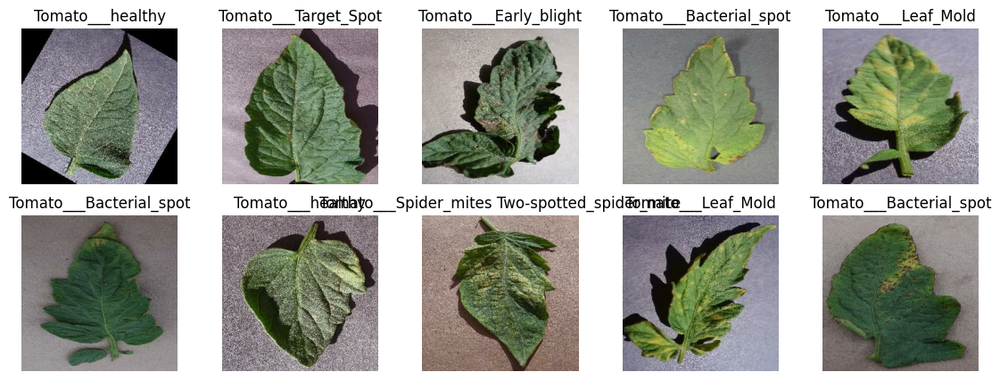




>>>> Sample Images of "train" dataset


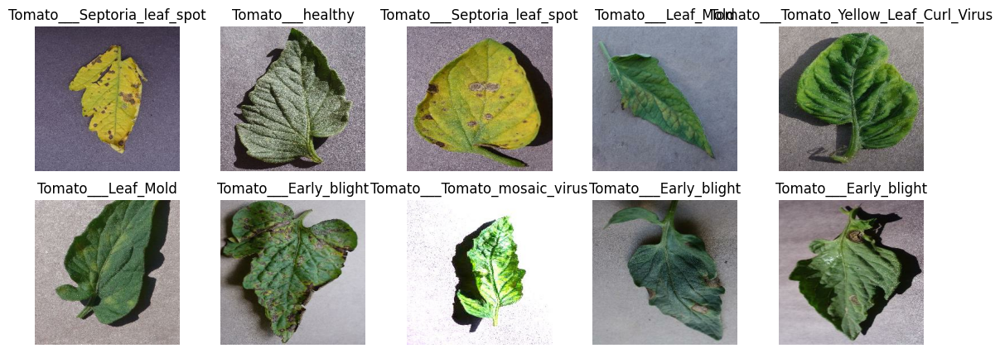




>>>> Sample Images of "valid" dataset


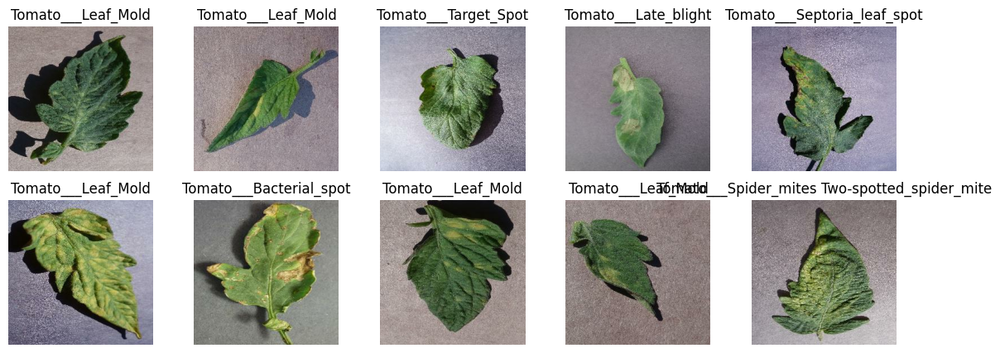

In [ ]:
for plant in plant_dirs:
    print(f'>>>> Sample Images of "{plant}" dataset')
    plt.figure(figsize=(14,5))
    for image_batch, image_label in train_dataset[plant].take(1):
        for i in range(10):
            plt.subplot(2,5,i+1)
            plt.imshow(image_batch[i].numpy().astype('uint8'))
            plt.title(classes[plant][image_label[i]])
            plt.axis('off')
        plt.show()
    print("\n\n")

In [ ]:
# getting values of training dataset
train_dataset.values()

dict_values([<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>, <_PrefetchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>, <_PrefetchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>])

### Plotting the standardized images for random plant leaf images

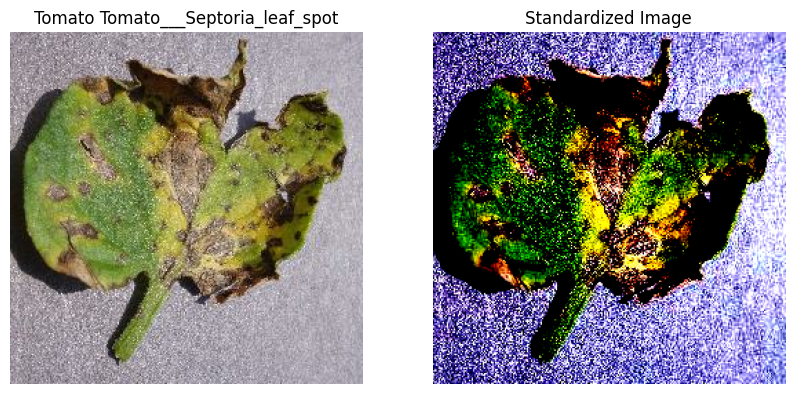

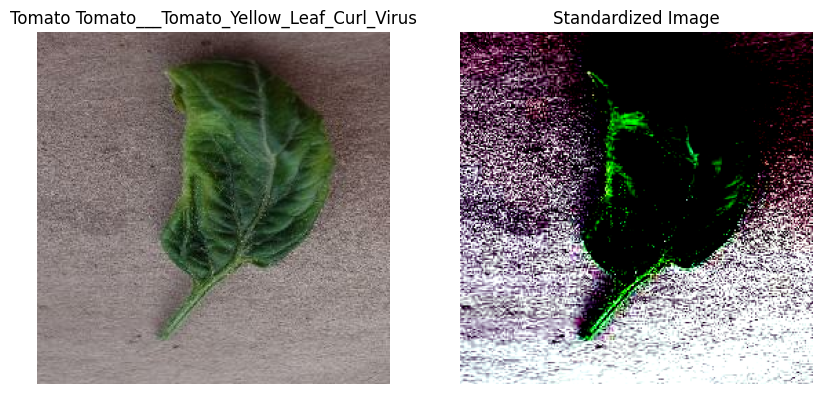

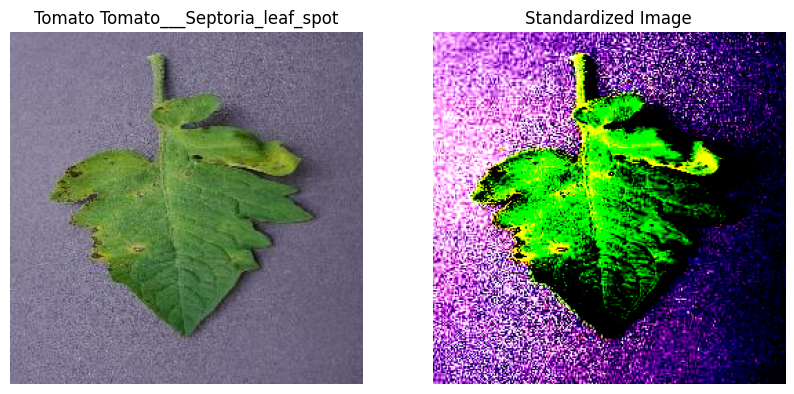

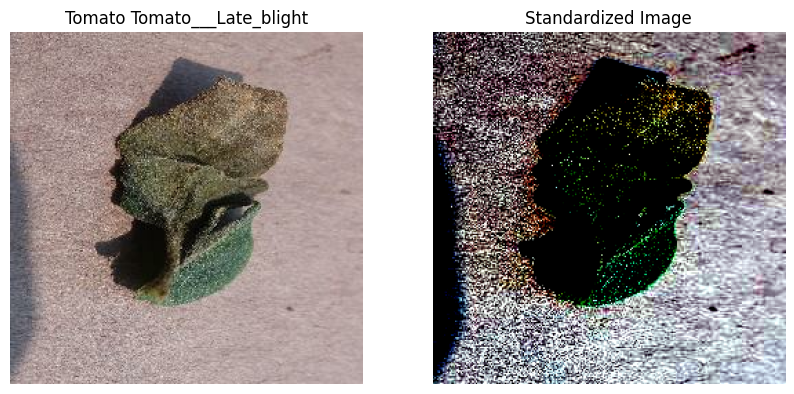

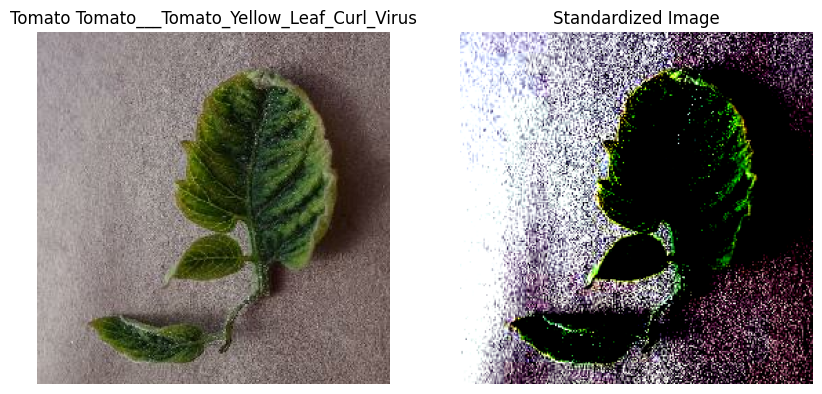

In [ ]:
# Creating a function for standardizing images
def std_img(img):
    img_flat = img.reshape(-1,3)
    scaler = StandardScaler()
    img_std = scaler.fit_transform(img_flat)
    img_std = img_std.reshape(256,256,3)
    return img_std

# getting the standardized images with labels
tomato_img = []
tomato_label = []
for img,label in train_dataset[plant].take(1):
    for i in range(5):
        tomato_img.append(img[i])
        tomato_label.append(classes["test"][label[i]])

for i in range(5):
    # typcasting
    nik = np.array(tomato_img[i]).astype('uint8')
    img_std = std_img(nik)


    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(nik)
    plt.title("Tomato "+tomato_label[i])
    plt.axis('off')
    plt.subplot(1, 2, 2)
    plt.imshow(img_std)
    plt.title('Standardized Image')
    plt.axis('off')
plt.show()

### Plotting the 32X32 patch format of a image

Image size: 224 X 224
Patch size: 32 X 32
Patches per image: 49
Elements per patch: 3072


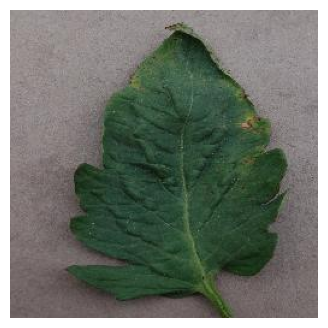

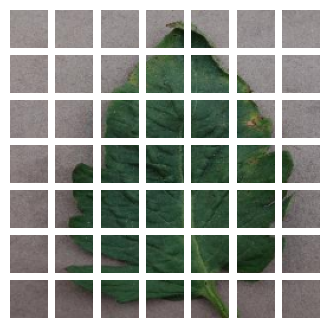

In [ ]:
image_size = 224
img_height, img_width = 512, 512
patch_size = 32
num_patches = (image_size // patch_size) ** 2
class Patches(layers.Layer):

    def __init__(self, patch_size):
        super(Patches, self).__init__()
        super(Patches, self).__init__()
        self.patch_size = patch_size
    def call(self, images):
        batch_size = tf.shape(images)[0]
        patches = tf.image.extract_patches(
            images=images,
            sizes=[1, self.patch_size, self.patch_size, 1],
            strides=[1, self.patch_size, self.patch_size, 1],
            rates=[1, 1, 1, 1],
            padding="VALID",
        )
        patch_dims = patches.shape[-1]
        patches = tf.reshape(patches, [batch_size, -1, patch_dims])
        return patches


import matplotlib.pyplot as plt
import matplotlib.image as mpimg
plt.figure(figsize=(4, 4))

target = "/content/tomato_dataset/train/Tomato___Bacterial_spot"
random_num = random.choice(os.listdir(target))
image = mpimg.imread("/content/tomato_dataset/train/Tomato___Bacterial_spot/" + random_num)
plt.imshow(image.astype("uint8"))
plt.axis("off")
resized_image = tf.image.resize(
    tf.convert_to_tensor([image]), size=(image_size, image_size)
)
patches = Patches(patch_size)(resized_image)
print(f"Image size: {image_size} X {image_size}")
print(f"Patch size: {patch_size} X {patch_size}")
print(f"Patches per image: {patches.shape[1]}")
print(f"Elements per patch: {patches.shape[-1]}")
n = int(np.sqrt(patches.shape[1]))
plt.figure(figsize=(4, 4))
for i, patch in enumerate(patches[0]):
    ax = plt.subplot(n, n, i + 1)
    patch_img = tf.reshape(patch, (patch_size, patch_size, 3))
    plt.imshow(patch_img.numpy().astype("uint8"))
    plt.axis("off")


# **Model Development**

### Declaring the paths for the training, testing, validation path, labels for the given plant diseases and the output length

In [ ]:
train_path = f"{plant_path}/train"
val_path = f"{plant_path}/valid"
test_path = f"{plant_path}/test"
out_labels = os.listdir(f"{plant_path}/train/")
out_len = len(out_labels)

In [ ]:
out_len

10

### Declaring the batch size of 64 and the image size of 224X224 pixels


In [ ]:
batch_size = 64
img_height = 224

### Declare the ImageDataGenerator for the train_datagen and test_datagen, val_datagen. For train_datagen the images are augumented and for all the three datagenerators the pixels are scaled

In [ ]:
train_datagen = ImageDataGenerator(rescale = 1./255.,rotation_range=20,shear_range=0.15,horizontal_flip=True,)
val_datagen = ImageDataGenerator(rescale = 1./255)
test_datagen = ImageDataGenerator(rescale = 1./255)

### Declaring the train, test and valid sets for the input to the model, making every image to be of the size 224X224 pixels


In [ ]:
train_set = train_datagen.flow_from_directory(train_path,target_size = (224,224),batch_size = 64,shuffle = True,class_mode = 'categorical')
val_set = val_datagen.flow_from_directory(val_path,target_size = (224, 224),batch_size = 64,shuffle = False,class_mode = 'categorical')
test_set = val_datagen.flow_from_directory(test_path,target_size = (224, 224),batch_size = 64,shuffle = False,class_mode = 'categorical')

Found 18345 images belonging to 10 classes.
Found 4585 images belonging to 10 classes.
Found 50 images belonging to 10 classes.


### Loading the pretrained VIT model with RESNET50 as backbone with 32 patch size and pretrained on ImageNet-21k dataset. Building a classifier head over the pretrained VIT Model with out_len as the output shape which is equal to the number of disease of plant

In [ ]:
fe_L2 = hub.KerasLayer("https://tfhub.dev/sayakpaul/vit_r50_l32_fe/1",input_shape = (224,224,3),trainable = False,name = "Pre_Trained_")
VIT = tf.keras.Sequential([
    fe_L2,
    layers.Dense(128,activation = "relu"),
    layers.Dropout(0.5),
    layers.Dense(out_len, activation = "softmax", name = "output_layer")
])

VIT.compile(loss = "categorical_crossentropy",optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0001),metrics = ["accuracy"])

### Trianing the model for 10 epochs

In [ ]:
epochs = 10
r=VIT.fit(train_set,epochs = epochs,validation_data = val_set,steps_per_epoch=len(train_set),validation_steps = len(val_set))

Epoch 1/10
287/287 [==============================] - 518s 2s/step - loss: 1.9442 - accuracy: 0.4606 - val_loss: 0.7074 - val_accuracy: 0.7895
Epoch 2/10
287/287 [==============================] - 385s 1s/step - loss: 0.8067 - accuracy: 0.7290 - val_loss: 0.4303 - val_accuracy: 0.8713
Epoch 3/10
287/287 [==============================] - 391s 1s/step - loss: 0.5602 - accuracy: 0.8132 - val_loss: 0.2970 - val_accuracy: 0.9093
Epoch 4/10
287/287 [==============================] - 415s 1s/step - loss: 0.4359 - accuracy: 0.8545 - val_loss: 0.2397 - val_accuracy: 0.9243
Epoch 5/10
287/287 [==============================] - 396s 1s/step - loss: 0.3495 - accuracy: 0.8827 - val_loss: 0.2119 - val_accuracy: 0.9328
Epoch 6/10
287/287 [==============================] - 387s 1s/step - loss: 0.3039 - accuracy: 0.9011 - val_loss: 0.1793 - val_accuracy: 0.9400
Epoch 7/10
287/287 [==============================] - 388s 1s/step - loss: 0.2636 - accuracy: 0.9137 - val_loss: 0.1715 - val_accuracy: 0.9453

### Saving the model with plant name

In [ ]:
model_name = "tomato"+"_model.h5"
VIT.save(model_name)

### To make the model file to be availabel for download, run the following code

In [ ]:
!zip model_file.zip /content/

updating: content/df/ (stored 0%)


Plotting Accuracy Curve

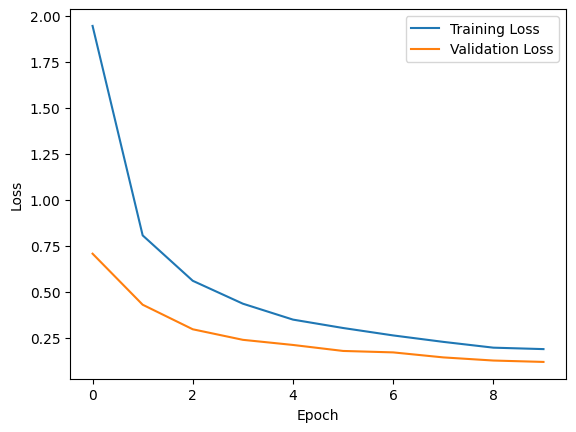

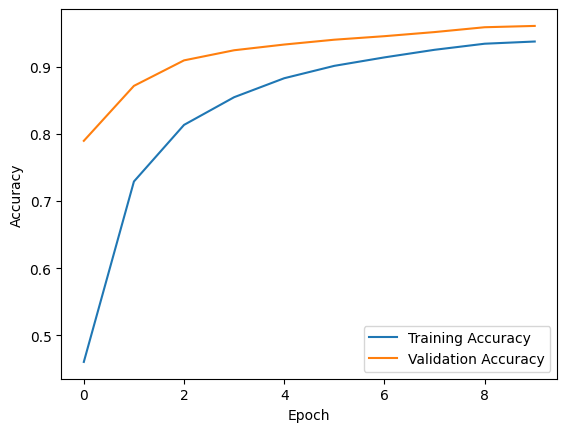

1/1 [==============================] - 1s 789ms/step - loss: 0.1120 - accuracy: 0.9600
Test Loss: 0.11198386549949646, Test Accuracy: 0.9599999785423279


In [ ]:
# import matplotlib.pyplot as plt
# history_with_dropout = r
# # Plot training and validation loss
# plt.plot(r.history['loss'], label='Training Loss')
# plt.plot(r.history['val_loss'], label='Validation Loss')
# plt.xlabel('Epoch')
# plt.ylabel('Loss')
# plt.legend()
# plt.show()

# # Plot training and validation accuracy
# plt.plot(r.history['accuracy'], label='Training Accuracy')
# plt.plot(r.history['val_accuracy'], label='Validation Accuracy')
# plt.xlabel('Epoch')
# plt.ylabel('Accuracy')
# plt.legend()
# plt.show()

# # Evaluate the model on the test set
# test_loss, test_accuracy = VIT.evaluate(test_set)
# print(f'Test Loss: {test_loss}, Test Accuracy: {test_accuracy}')


Learning rate graph

In [ ]:
r.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

In [ ]:
# import matplotlib.pyplot as plt
# import numpy as np
# import seaborn as sns
# # Plot learning rate over epochs
# plt.figure(figsize=(5, 5))
# plt.plot(VIT.history['accuracy'], label='Learning Rate')
# plt.title('Learning Rate Over Epochs')
# plt.xlabel('Epochs')
# plt.ylabel('Learning Rate')
# plt.legend()
# plt.show()


TypeError: 'History' object is not subscriptable

<Figure size 500x500 with 0 Axes>

### Predicting the test_set for the model

In [ ]:
Y_pred = VIT.predict(test_set, steps = len(test_set) )
y_pred = np.argmax(Y_pred, axis=1)

1/1 [==============================] - 32s 32s/step


In [ ]:
y_pred

array([0, 0, 0, 0, 0, 1, 2, 1, 1, 1, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 1, 4,
       4, 4, 4, 5, 5, 5, 5, 5, 6, 6, 6, 6, 6, 7, 7, 7, 7, 7, 8, 8, 8, 8,
       8, 9, 9, 9, 9, 9])

### Plotting the confusion matrix for given y_pred and y_true

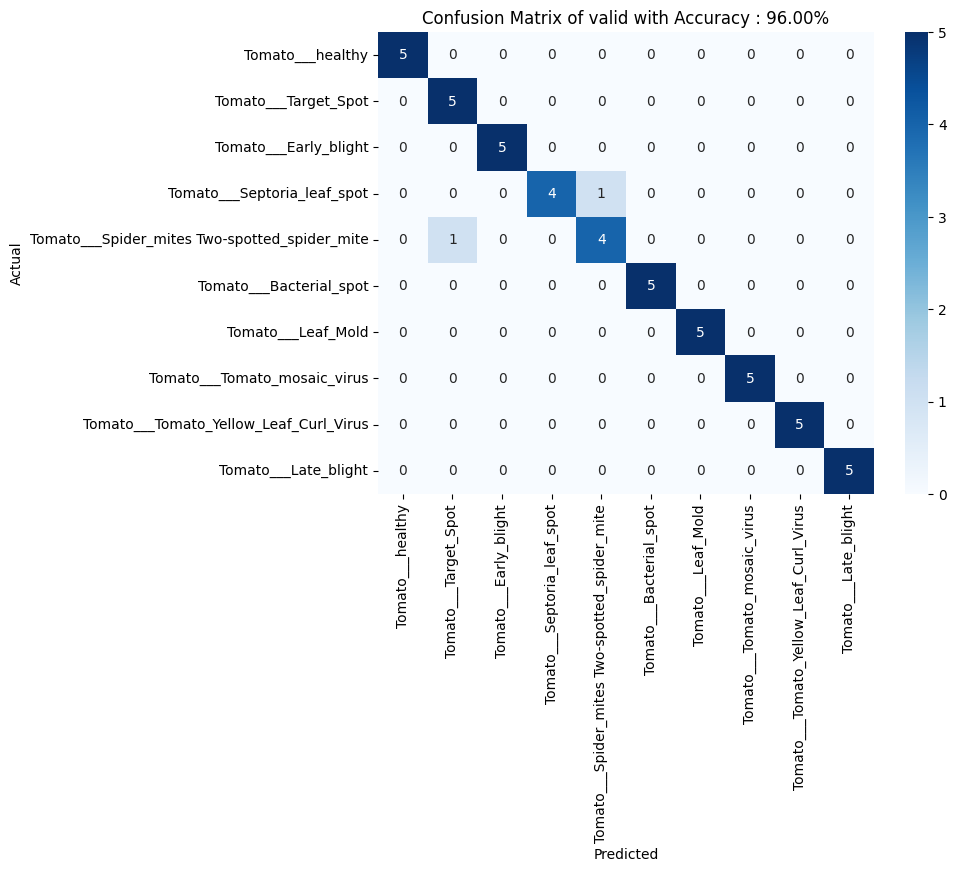

In [ ]:
cf = confusion_matrix(test_set.classes, y_pred)
list = os.listdir(f"{plant_path}/train")
plt.figure(figsize=(8, 6))
sns.heatmap(cf, annot=True, fmt='d', cmap='Blues',xticklabels=out_labels,yticklabels=out_labels)
plt.title(f'Confusion Matrix of {plant} with Accuracy : {accuracy_score(test_set.classes, y_pred) * 100:.2f}%')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt_name = plant+"_CF.png"
plt.savefig(plt_name)
plt.show()

### Printing the classification report

In [ ]:
print('-_-_-_-_-_-_-_-_-_-_-_-_-_-_-_-_>>>>Classification Report<<<<-_-_-_-_-_-_-_-_-_-_-_-_-_-_-_-_')
print(classification_report(test_set.classes, y_pred, target_names=out_labels))

-_-_-_-_-_-_-_-_-_-_-_-_-_-_-_-_>>>>Classification Report<<<<-_-_-_-_-_-_-_-_-_-_-_-_-_-_-_-_
                                               precision    recall  f1-score   support

                         Tomato___Target_Spot       1.00      1.00      1.00         5
       Tomato___Tomato_Yellow_Leaf_Curl_Virus       0.80      0.80      0.80         5
                           Tomato___Leaf_Mold       0.83      1.00      0.91         5
                             Tomato___healthy       1.00      1.00      1.00         5
Tomato___Spider_mites Two-spotted_spider_mite       1.00      0.80      0.89         5
                  Tomato___Septoria_leaf_spot       1.00      1.00      1.00         5
                      Tomato___Bacterial_spot       1.00      1.00      1.00         5
                         Tomato___Late_blight       1.00      1.00      1.00         5
                        Tomato___Early_blight       1.00      1.00      1.00         5
                 Tomato___Tomato_mo

### Plotting the model Accuracy and Loss Graphs

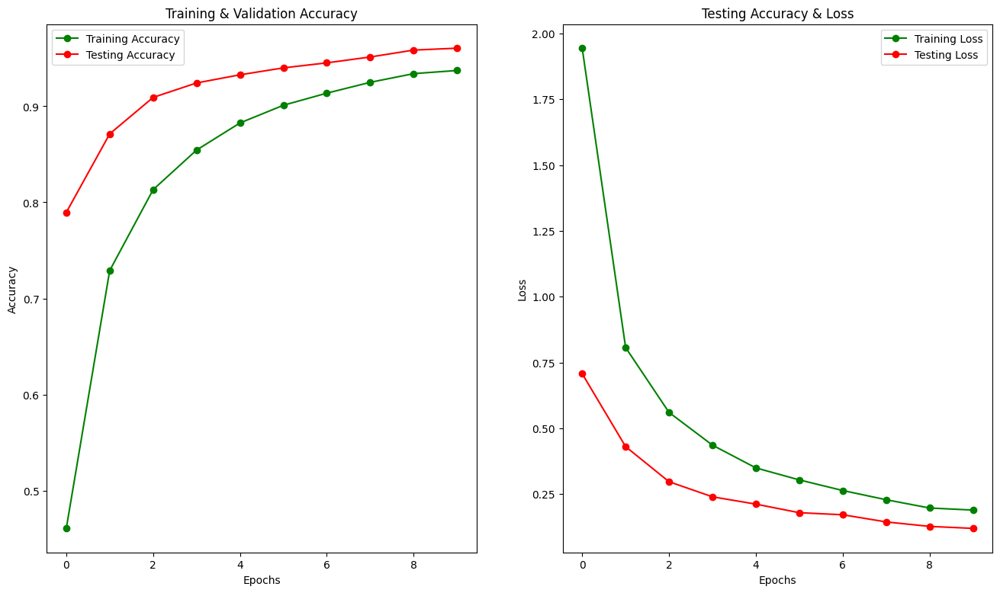

In [ ]:
epochs = [i for i in range(10)]
fig , ax = plt.subplots(1,2)
train_acc = r.history['accuracy']
train_loss = r.history['loss']
val_acc = r.history['val_accuracy']
val_loss = r.history['val_loss']
fig.set_size_inches(16,9)

ax[0].plot(epochs , train_acc , 'go-' , label = 'Training Accuracy')
ax[0].plot(epochs , val_acc , 'ro-' , label = 'Validation Accuracy')
ax[0].set_title('Training & Validation Accuracy')
ax[0].legend()
ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Accuracy")

ax[1].plot(epochs , train_loss , 'g-o' , label = 'Training Loss')
ax[1].plot(epochs , val_loss , 'r-o' , label = 'Validation Loss')
ax[1].set_title('Training & Validation Loss')
ax[1].legend()
ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("Loss")

plt.show()

In [ ]:
# Evaluate the model on the test set
test_loss, test_accuracy = VIT.evaluate(test_set)
print(f'Test Loss: {test_loss}, Test Accuracy: {test_accuracy}')

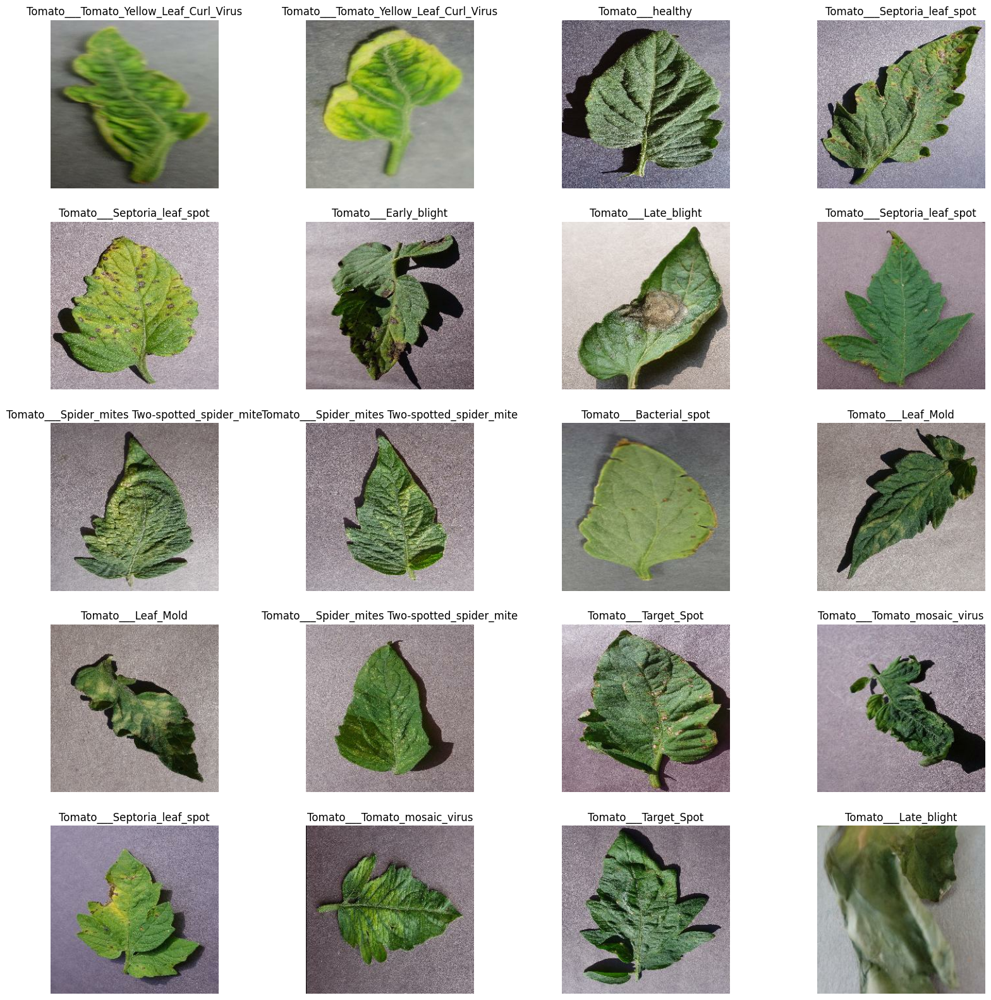

In [ ]:
plt.figure(figsize=(20,20))
for image_batch , image_label in test_set.take(1):
    for i in range(20):
        plt.subplot(5,4,i+1)
        plt.imshow(image_batch[i].numpy().astype("uint8"))
        plt.title(class_label[image_label[i].numpy()])
        plt.axis("off")

Found 50 images belonging to 10 classes.


1/1 [==============================] - 2s 2s/step


1/1 [==============================] - 2s 2s/step


1/1 [==============================] - 2s 2s/step


1/1 [==============================] - 1s 1s/step


1/1 [==============================] - 2s 2s/step


1/1 [==============================] - 2s 2s/step


1/1 [==============================] - 2s 2s/step


1/1 [==============================] - 1s 1s/step


1/1 [==============================] - 1s 1s/step


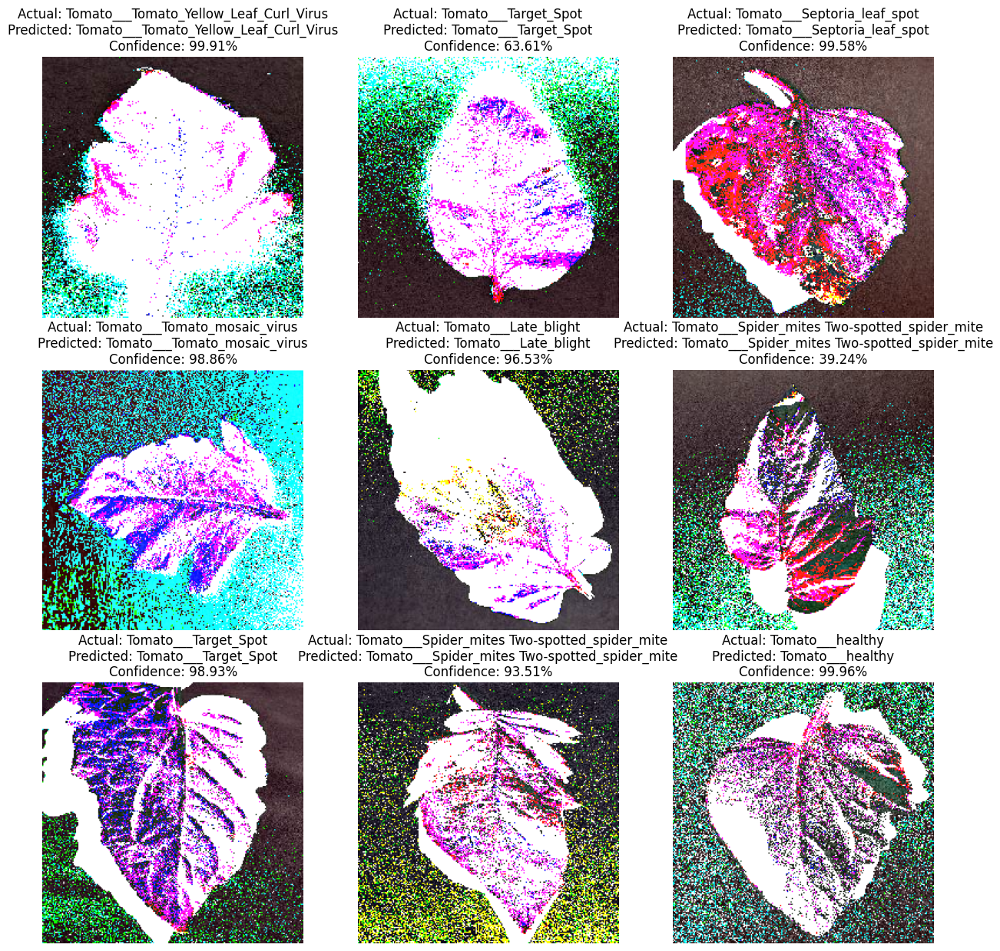

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.applications.resnet50 import preprocess_input
val_datagen = ImageDataGenerator(preprocessing_function=tf.keras.applications.resnet.preprocess_input)

# Flow training and validation data in batches using generators
train_gen = val_datagen.flow_from_directory(test_data_dir, target_size=(224, 224), batch_size=32, class_mode='categorical')
# Define the class names
class_names = train_dataset['train'].class_names
model_with_dropout = loaded_model
# Function to preprocess a single image
def preprocess_image(img):
    img = tf.image.resize(img, (224, 224))  # Resize to the input shape required by the model
    img = preprocess_input(img)  # Preprocess the image
    img = tf.expand_dims(img, 0)  # Add batch dimension
    return img

# Function to predict the class and confidence
def predict(img):
    img_array = preprocess_image(img)  # Preprocess the image
    predictions = model_with_dropout.predict(img_array)
    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence

# Load the model
# model_path = '/content/cnnResnet50Model.h5'
# model_with_dropout = tf.keras.models.load_model(model_path)

# Plotting the images with predictions
plt.figure(figsize=(15, 15))

for images, labels in train_gen:
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        image = images[i]
        plt.imshow(image.astype("uint16"))

        predicted_class, confidence = predict(image)
        index = labels[i].argmax(axis=0)
        actual_class = class_names[index]

        plt.title(f"Actual: {actual_class}\nPredicted: {predicted_class}\nConfidence: {confidence}%")
        plt.axis("off")
    break  # Break after the first batch

plt.show()


In [ ]:
classes.get('train')

['Tomato___Bacterial_spot',
 'Tomato___Early_blight',
 'Tomato___Late_blight',
 'Tomato___Leaf_Mold',
 'Tomato___Septoria_leaf_spot',
 'Tomato___Spider_mites Two-spotted_spider_mite',
 'Tomato___Target_Spot',
 'Tomato___Tomato_Yellow_Leaf_Curl_Virus',
 'Tomato___Tomato_mosaic_virus',
 'Tomato___healthy']

: